# Wavenet

In [1]:
from IPython.display import Image, Audio
import librosa
import librosa.display

%matplotlib inline
import matplotlib.pyplot as plt

import numpy as np

In [2]:
Image(url='wavenet.gif')

(see [Deepmind's blog post](https://deepmind.com/blog/wavenet-generative-model-raw-audio/) for more)

- dilated convolutions 
    - expand receptive field
    - translation in(equi)variance? (cf. algorithme à trous?)
    - note no downsampling
- autoregressive approach to generating audio
- 8 bit, via 256-way softmax

# Wavenet autoencoder

In [3]:
Image(url='wavenet_autoencoder.png')

> The temporal encoder looks very much like a WaveNet and has the same dilation block structure. However, its convolutions are not causal, so it sees the entire context of the input chunk. After thirty layers of computation, there is then a final average pooling to create a temporal embedding of 16 dimensions for every 512 samples. Consequently, the embedding can be thought of as a 32x compression of the original data.

>We condition the vanilla WaveNet decoder with this embedding by upsampling it to the original time resolution, applying a 1x1 convolution, and finally adding this result as a bias to each of the decoder’s thirty layers. Note that this conditioning is not external as it’s learned by the model. Since the embeddings bias the autoregressive system, we can imagine it acting as a driving function for a nonlinear oscillator. This interpretation is corroborated by the fact that the magnitude contours of the embeddings mimic those of the audio itself.

(via [Magenta's blogpost](https://magenta.tensorflow.org/nsynth))

(see also [the paper](https://arxiv.org/abs/1704.01279))

## NSynth Dataset

it is a lot of instrument sounds
- single (known) note
- some labelled timbral characteristics

### Why wavenet autoencoder

as opposed to a normal one?

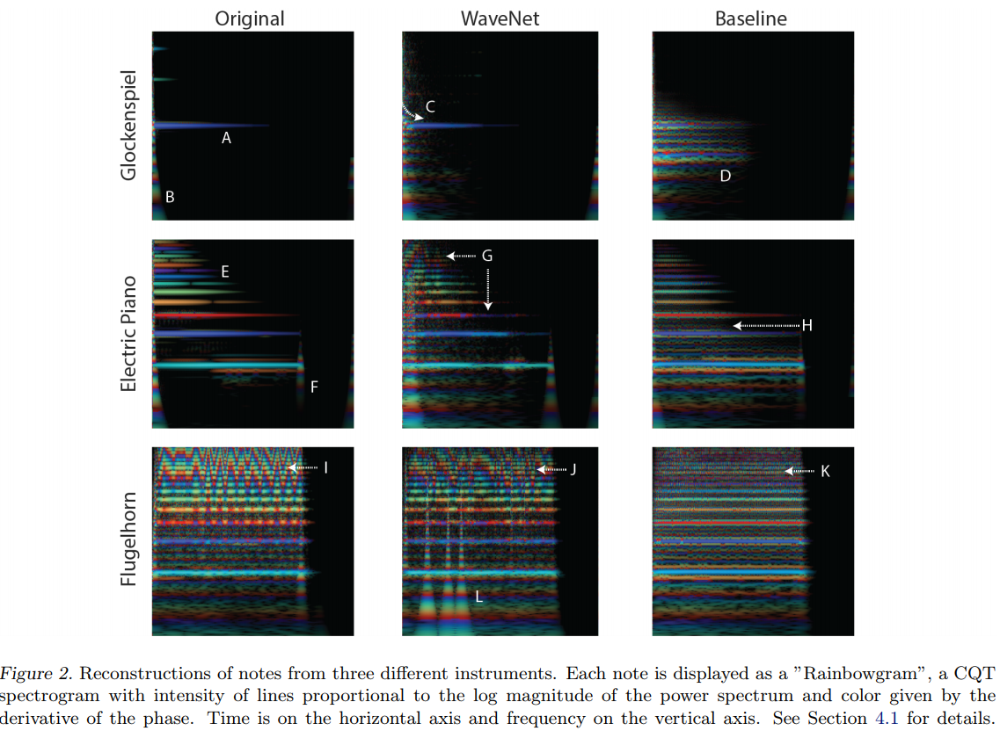

In [4]:
Image('figure_2.png')

- wavenet does a (qualitatively?) better job on the reconstructions than just an autoencoder on the spectrograms

# Issues

- 10 days, 32 workers, ~1GB of weights ([available here though](https://github.com/tensorflow/magenta/tree/master/magenta/models/nsynth))
- still only 8 bit, 16kHz -- not quite good enough for making music (the stated aim)
- takes most of the night to generate around a minute of audio

But we have a generative model of raw audio, so we can generate some audio by mucking around with the embeddings.
See [this blog post](https://magenta.tensorflow.org/nsynth-fastgen) for some inspiration.

# Examples

In [5]:
def show_example(filename):
    # plot a log magnitude specgram, embed the audio
    data, sr = librosa.load(filename, sr=16000)
    specgram = librosa.stft(data) # default 2048 point FFT, hop size 512, 'hann' window
    specgram = librosa.amplitude_to_db(specgram, ref=np.max)
    plt.figure(figsize=(15,10))
    librosa.display.specshow(specgram,
                             sr=sr,
                             x_axis='time',
                             y_axis='log')
    plt.title(filename + ' log magnitude spectrogram')
    plt.colorbar(format='%+2.0f dB')
    return Audio(data, rate=sr)

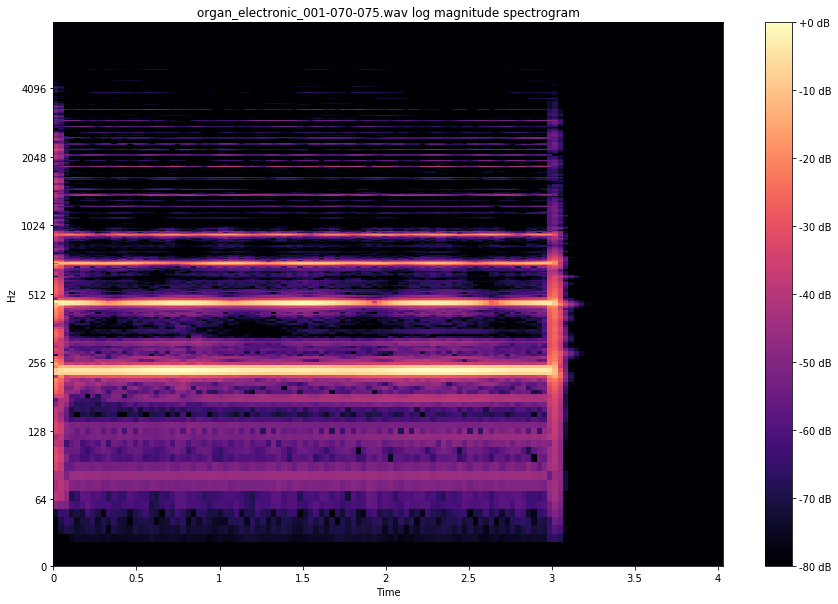

In [6]:
# The original
show_example('organ_electronic_001-070-075.wav')

The reconstruction is close (although it sounds pretty 8 bit)

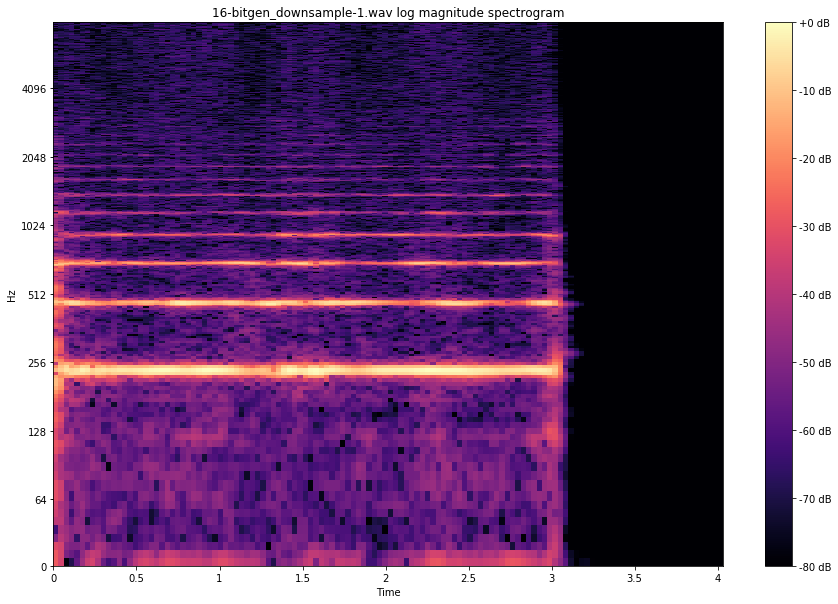

In [7]:
show_example('16-bitgen_downsample-1.wav')

stretching and squeezing (upsampling and downsampling) the embeddings keeps the sound pretty consistent (just longer or shorter)

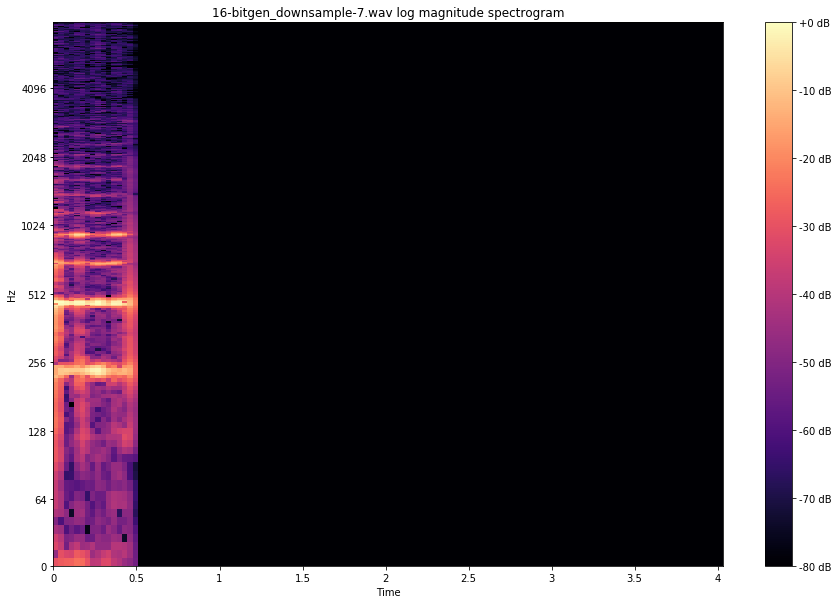

In [8]:
show_example('16-bitgen_downsample-7.wav')

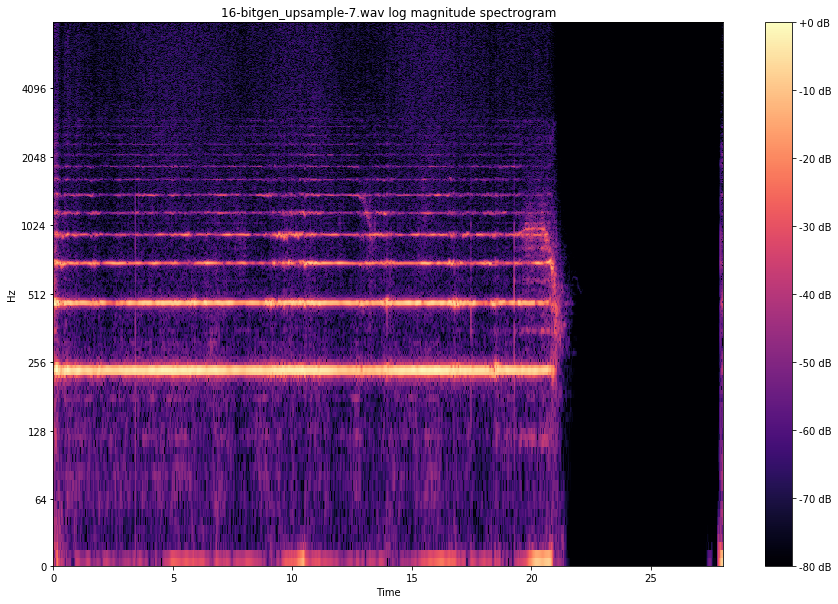

In [9]:
show_example('16-bitgen_upsample-7.wav')

How much does the manifold of sensible embeddings fill the space of possible embeddings? If we start with an embedding from a real sound, how real does it sound as we get further away?

The below is generated by taking a random walk from the first time-slice of the organ embedding and linearly interpolating some extra frames in between.

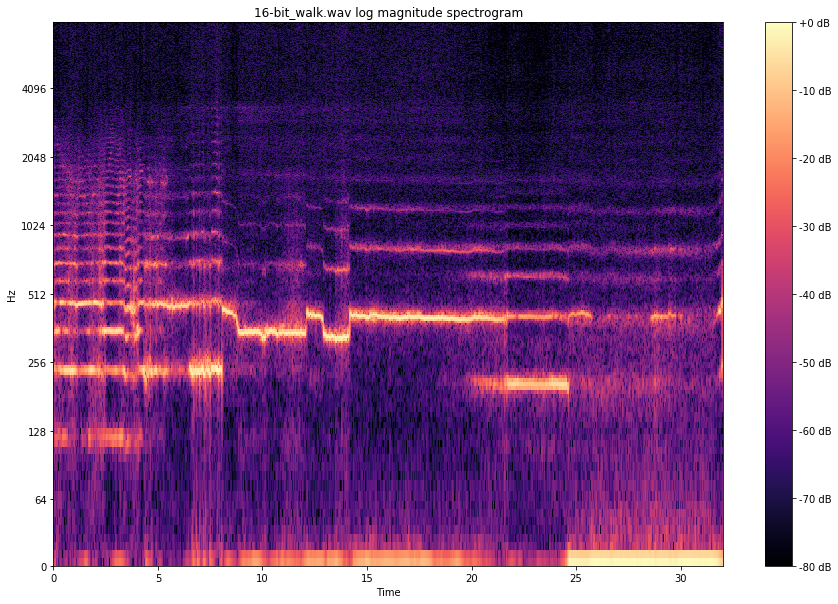

In [10]:
show_example('16-bit_walk.wav')

Note the jumps are fairly sudden
- it was trained only on specific pitches (ie. 12 tone equal temperament at A440) so a jumpy fundamental frequency is expected
- harmonic shifts and changes in noise level are similarly twitchy, even though the embeddings move smoothly by design
- authors mention no regularisation on the hidden space as they felt it was still underfitting

What happens if we just add random noise:
- added gaussian noise at 25 different levels (stddev in (0 - 0.5))
- stick all the results (after generation, not one long embedding)

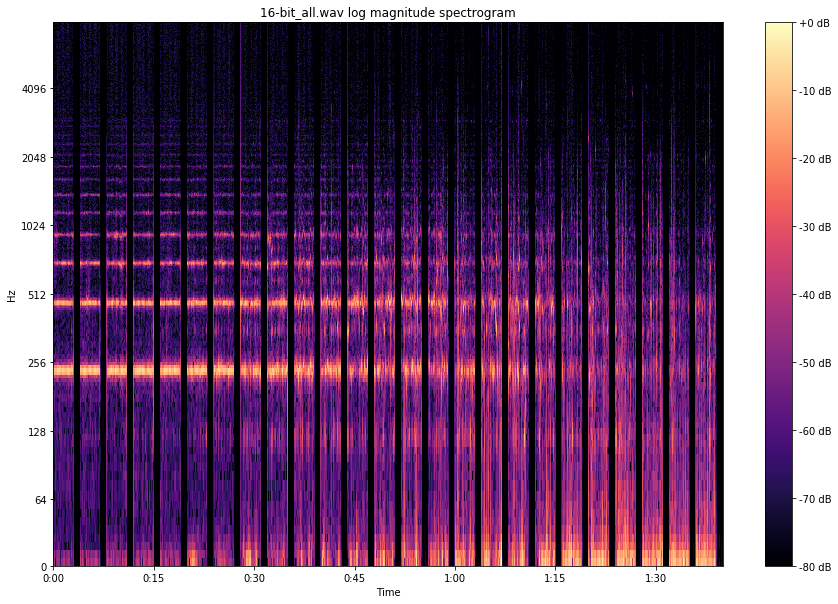

In [11]:
show_example('16-bit_all.wav')